In [780]:
# Import the required packages
import numpy as np
import pandas as pd
from scipy.fft import fft, rfft
from scipy.fft import fftfreq, rfftfreq
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [602]:
df = pd.read_csv("Metazygia monitor 1.csv")
df = df[6904:]
df2 = df[:6904]

min_day=1440
total_time = len(df.index)
num_days = total_time//min_day

df = df.drop(['Monitor 1 Spider 17', 
              'Monitor 1 Spider 22', 'Monitor 1 Spider 23', 'Monitor 1 Spider 24'] , axis = 1)
df2 = df2.drop(['Monitor 1 Spider 12', 'Monitor 1 Spider 14', 'Monitor 1 Spider 17', 
              'Monitor 1 Spider 22', 'Monitor 1 Spider 23', 'Monitor 1 Spider 24'] , axis = 1)
#display(df)

In [603]:
names = df2.columns[2:]
print(names)

Index(['Monitor 1 Spider 1', 'Monitor 1 Spider 2', 'Monitor 1 Spider 3',
       'Monitor 1 Spider 4', 'Monitor 1 Spider 5', 'Monitor 1 Spider 6',
       'Monitor 1 Spider 7', 'Monitor 1 Spider 8', 'Monitor 1 Spider 9',
       'Monitor 1 Spider 10', 'Monitor 1 Spider 11', 'Monitor 1 Spider 13',
       'Monitor 1 Spider 15', 'Monitor 1 Spider 16', 'Monitor 1 Spider 18',
       'Monitor 1 Spider 19', 'Monitor 1 Spider 20', 'Monitor 1 Spider 21',
       'Monitor 1 Spider 25', 'Monitor 1 Spider 26', 'Monitor 1 Spider 27',
       'Monitor 1 Spider 28', 'Monitor 1 Spider 29', 'Monitor 1 Spider 30',
       'Monitor 1 Spider 31', 'Monitor 1 Spider 32'],
      dtype='object')


In [692]:
# Building a class Signal for better use.
class Signal:
  """
  Generate sinusoidal signals with specific ampltiudes, frequencies, duration,
  sampling rate, and phase.
  Example:
    signal = Signal(amplitude=10, sampling_rate=2000.0)
    sine = signal.sine()
    cosine = signal.cosine()
  """

  def __init__(self, amplitude=1, frequency=10, duration=1, sampling_rate=100.0, phase=0):
    """
    Initialize the Signal class.
    Args:
        amplitude (float): The amplitude of the signal
        frequency (int): The frequency of the signal Hz
        duration (float): The duration of the signal in second
        sampling_rate (float): The sampling per second of the signal
        phase (float): The phase of the signal in radians
    
    Additional parameters,which are required to generate the signal, are
    calculated and defined to be initialized here too:
        time_step (float): 1.0/sampling_rate
        time_axis (np.array): Generate the time axis from the duration and
                              the time_step of the signal. The time axis is
                              for better representation of the signal.
    """
    self.amplitude = amplitude
    self.frequency = frequency
    self.duration = duration
    self.sampling_rate = sampling_rate
    self.phase = phase
    self.time_step = 1.0/self.sampling_rate
    self.time_axis = np.arange(0, self.duration, self.time_step)
  
  # Generate sine wave
  def sine(self):
    """
    Method of Signal
    Returns:
        np.array of sine wave using the pre-defined variables (amplitude,
        frequency, time_axis, and phase)
    """
    return self.amplitude*np.sin(2*np.pi*self.frequency*self.time_axis+self.phase)
  
  # Generate cosine wave
  def cosine(self):
    """
    Method of Signal
    Returns:
        np.array of cosine wave using the pre-defined variables (amplitude,
        frequency, time_axis, and phase)
    """
    return self.amplitude*np.cos(2*np.pi*self.frequency*self.time_axis+self.phase)

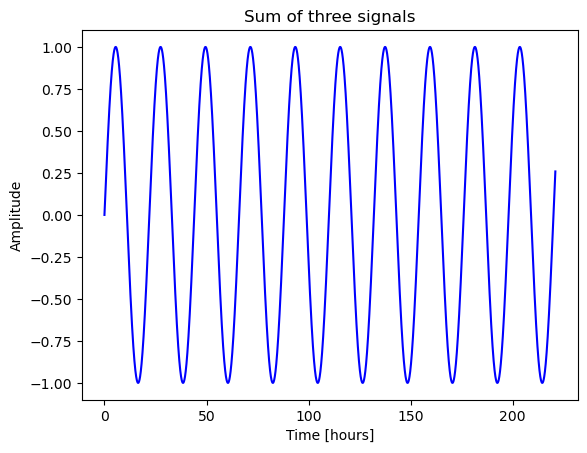

In [867]:
data = df['Monitor 1 Spider 25'].to_numpy()
# Generate the three signals using Signal class and its method sine()
signal_1hz = Signal(amplitude= 1, frequency=1/22, sampling_rate=60, duration=len(df['Monitor 1 Spider 18'])/60)
sine_1hz = signal_1hz.sine()
signal_20hz = Signal(amplitude=1, frequency=20, sampling_rate=200, duration=2)
sine_20hz = signal_20hz.sine()
signal_10hz = Signal(amplitude=0.5, frequency=10, sampling_rate=200, duration=2)
sine_10hz = signal_10hz.sine()

# Sum the three signals to output the signal we want to analyze
signal2 = sine_1hz
#signal = sine_1hz + sine_20hz + sine_10hz


# Sum the three signals to output the signal we want to analyze
#signal = sine_1hz + sine_20hz + sine_10hz
#signal = df['Monitor 1 Spider 18'].values
#signal = sine_20hz

# Plot the signal
plt.plot(signal_1hz.time_axis, signal2, 'b')
plt.xlabel('Time [hours]')
plt.ylabel('Amplitude')
plt.title('Sum of three signals')
plt.show()

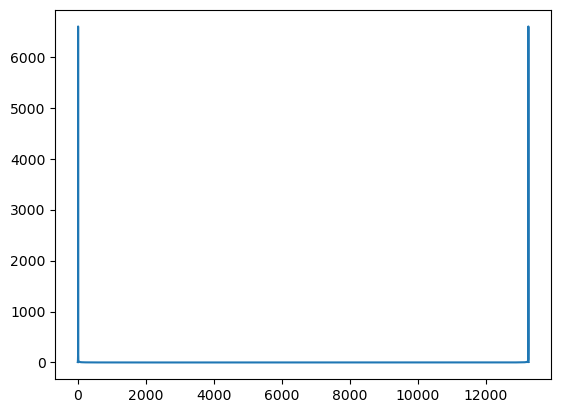

In [868]:
# Apply the FFT on the signal
fourier = fft(signal2)

# Plot the result (the spectrum |Xk|)
plt.plot(np.abs(fourier))
plt.show()

13256


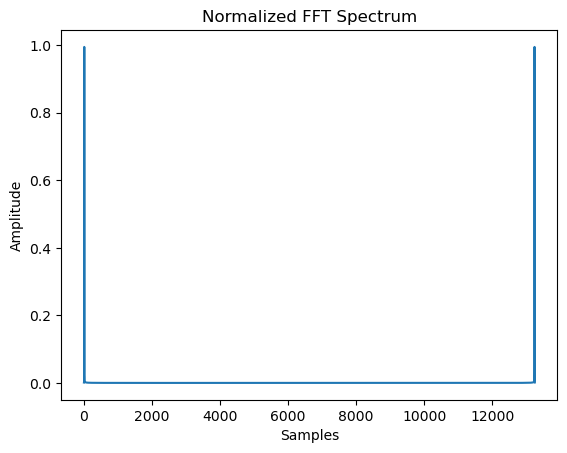

In [869]:
# Calculate N/2 to normalize the FFT output
N = len(signal2)
normalize = N/2
print(N)

# Plot the normalized FFT (|Xk|)/(N/2)
plt.plot(np.abs(fourier)/normalize)
plt.ylabel('Amplitude')
plt.xlabel('Samples')
plt.title('Normalized FFT Spectrum')
plt.show()

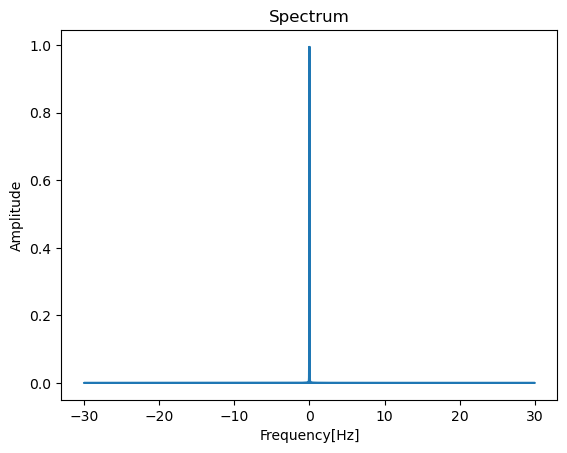

In [858]:
# Get the frequency components of the spectrum
sampling_rate = 60.0 # It's used as a sample spacing
frequency_axis = fftfreq(N, d=1.0/sampling_rate)
norm_amplitude = np.abs(fourier)/normalize
# Plot the results
plt.plot(frequency_axis, norm_amplitude)
plt.xlabel('Frequency[Hz]')
plt.ylabel('Amplitude')
plt.title('Spectrum')
plt.show()

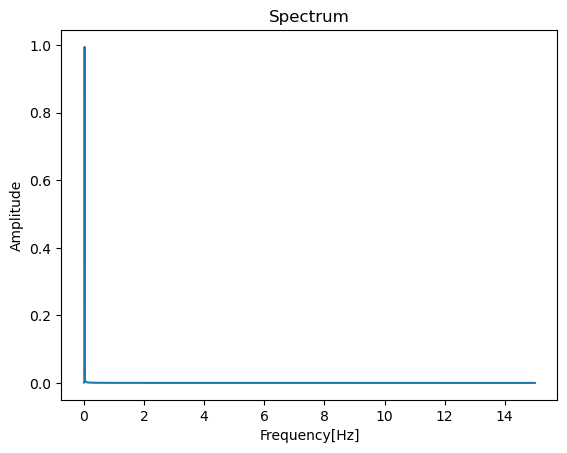

In [865]:
# Plot the actual spectrum of the signal
plt.plot(rfftfreq(N, d=2/sampling_rate), 2*np.abs(rfft(signal))/N)
plt.title('Spectrum')
plt.xlabel('Frequency[Hz]')
plt.ylabel('Amplitude')
plt.show()

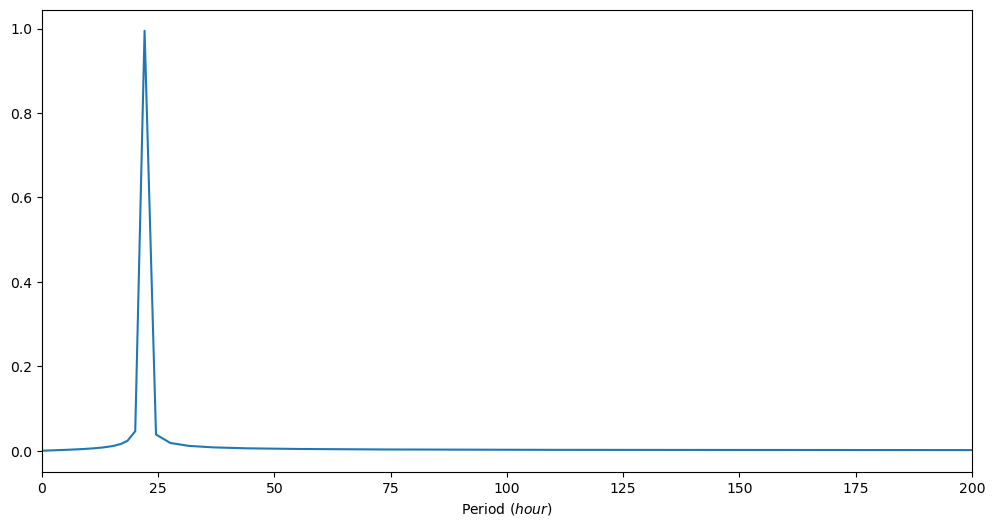

In [889]:
X = fft(signal)
N = len(X)
n = np.arange(N)
# get the sampling rate
sample_rate = 60
T = N/sample_rate
freq = n/T 

# Get the one-sided specturm
n_oneside = N//2
# get the one side frequency
f_oneside = freq[:n_oneside]

# convert frequency to hour
t_h = 1/f_oneside

plt.figure(figsize=(12,6))
plt.plot(t_h, np.abs(X[:n_oneside])/n_oneside)
plt.xlim(0, 200)
plt.xlabel('Period ($hour$)')
plt.show()

The period is 22.093333333333334 hours


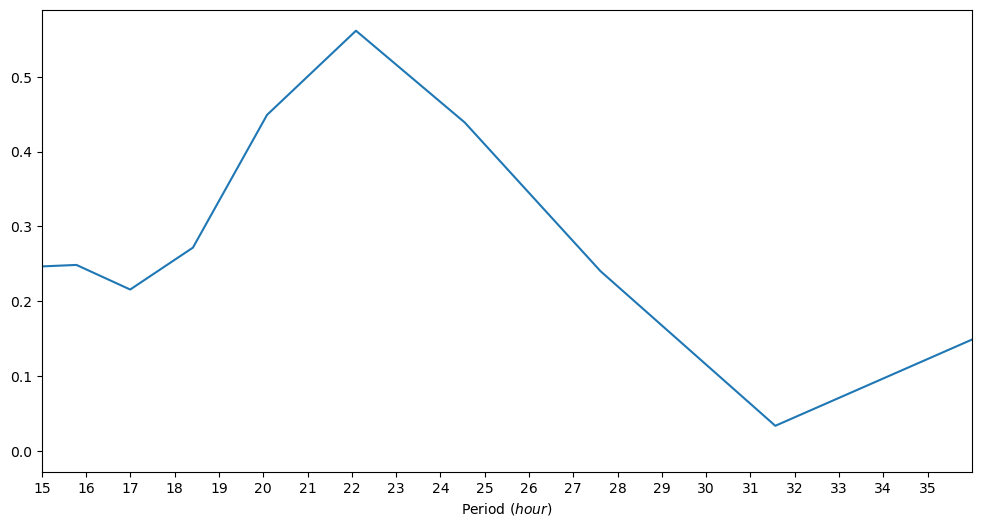

In [893]:
X = fft(df['Monitor 1 Spider 19'])
N = len(X)
n = np.arange(N)
# get the sampling rate
sample_rate = 60
T = N/sample_rate
freq = n/T 

# Get the one-sided specturm
n_oneside = N//2
# get the one side frequency
f_oneside = freq[:n_oneside]

# convert frequency to hour
t_h = 1/f_oneside

#Taking out infinities
sorted_t_h = t_h[np.isfinite(t_h)]

#Make andataframe to find the max frequency
amp = np.abs(X[:n_oneside])/n_oneside
df_freq = pd.DataFrame()  
df_freq['freq'] = sorted_t_h
df_freq['amp'] = amp[1:]
max_amp = df_freq['amp'].max()
max_freq = df_freq.loc[df_freq.amp == max_amp, 'freq'].values[0] 
print('The period is',max_freq, 'hours')


plt.figure(figsize=(12,6))
plt.plot(t_h, amp)
plt.xlim(15, 36)
plt.xticks(range(15, 36, 1))
plt.xlabel('Period ($hour$)')
plt.show()

In [836]:
#fourier = Fourier(signal = rolling_avg, sampling_rate=60)
fourier = Fourier(df['Monitor 1 Spider 28'], sampling_rate=60)
# Plot the spectrum interactively using the class Fourier
fourier.plot_spectrum(interactive=True)

The period is 18.41111111111111 hours


In [158]:
from scipy.signal import argrelextrema
#argrelextrema(fourier, np.greater)
display(fourier)

In [426]:
print('The period is', 1/0.0407, 'hours.')

The period is 24.57002457002457 hours.


In [94]:
# Apply the DFT using the class Fourier
fourier = Fourier(signal, sampling_rate=1440)
# Plot the spectrum interactively using the class Fourier
fourier.plot_spectrum(interactive=True)

/Users/schuylerclark/opt/anaconda3/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [117]:
print('The period is', 1/0.0018, 'hours.')
activity_data = df['Monitor 1 Spider 18'].values
rolling_avg = pd.Series(activity_data).rolling(window=60).mean()
rolling_avg = np.array(rolling_avg)

The period is 555.5555555555555 hours.


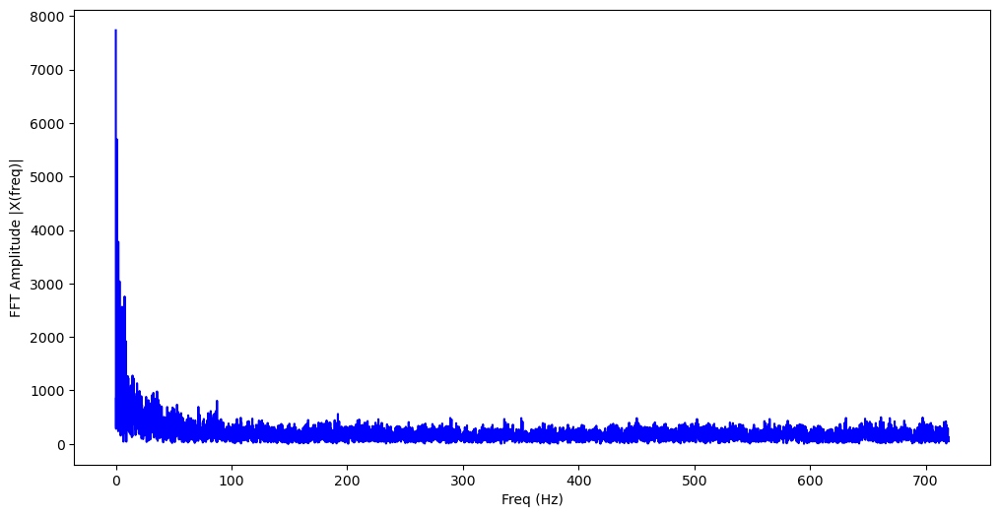

In [137]:
X = fft(df['Monitor 1 Spider 18'])
N = len(X)
n = np.arange(N)
# get the sampling rate
#sr = 1 / (60*60)
sr = 1440
T = N/sr
freq = n/T 

# Get the one-sided specturm
n_oneside = N//2
# get the one side frequency
f_oneside = freq[:n_oneside]

plt.figure(figsize = (12, 6))
plt.plot(f_oneside, np.abs(X[:n_oneside]), 'b')
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Amplitude |X(freq)|')
plt.show()